<h1 align="center"> Image Captioning With Attention</h1>

In this notebook you will teach network to use attention during captioning images.

Here is what we need to do:
1. Take pretrained VGG19 to build feature vectors for positions of images.
2. Stack LSTM with attention on top of that.
3. Train the model, draw attention maps.

This assignment is based on Alexander Panin's captioning assignment (https://github.com/yandexdataschool/Practical_DL/blob/spring2019/homework04/homework04_basic_part2_image_captioning.ipynb) and on the paper "Show, Attend and Tell" (https://arxiv.org/abs/1502.03044).

In [ ]:
# import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '0'
# https://drive.google.com/file/d/1qjzV7o5b9-mpiSLSA5U7fcLRBeouj7Z3/view?usp=sharing

SyntaxError: ignored

In [ ]:
import json
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import h5py

import sys

%matplotlib inline

In [ ]:
# you may need to install h5py, tqdm
#!pip install h5py tqdm
import sys
!{sys.executable} -m pip install h5py tqdm gdown

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#!gdown https://drive.google.com/uc?id=1e9NQ-PMDltz7caE6xJYMci-LM0rGuz36
!unzip /content/drive/MyDrive/attention.zip
# !rm -r attention.zip

Archive:  /content/drive/MyDrive/attention.zip
   creating: attention/
  inflating: attention/captions.json  
   creating: attention/.ipynb_checkpoints/
  inflating: attention/img_codes.hdf5  
  inflating: attention/captions_tokenized.json  


## Data structure

To save your time, we've already vectorized all MSCOCO17 images with a pre-trained VGG19 network from [torchvision](https://github.com/pytorch/vision/blob/master/torchvision/models/vgg.py).

The whole process takes anywhere between a day on CPU and 30min on 1x GeForce GTX 1060. If you want to play with that yourself, [you're welcome](https://drive.google.com/file/d/1NLtoLqZzeES_flgs9kmmeZD_tsCTenH1/view?usp=sharing).

Please either download data from [here](https://drive.google.com/file/d/1e9NQ-PMDltz7caE6xJYMci-LM0rGuz36/view?usp=drive_link) or generate it manually using the above script.

In [ ]:
f = h5py.File('./attention/img_codes.hdf5', 'r')
img_codes = f['data']

In [ ]:
captions = json.load(open('./attention/captions_tokenized.json'))

In [ ]:
print("Each image code is a 512x9x9-unit tensor [ shape: %s x %s ]" % (str(len(img_codes)), str(img_codes[0].shape)))
print(img_codes[0][:3].round(2), end='\n\n')
print("For each image there are 5 reference captions, e.g.:\n")
print('\n'.join(captions[0]))

Each image code is a 512x9x9-unit tensor [ shape: 118287 x (512, 9, 9) ]
[[[0.   0.   0.   0.   0.07 0.69 0.   0.   0.  ]
  [0.   0.24 0.   0.   0.63 1.94 1.21 0.72 0.46]
  [0.77 0.76 0.   0.   0.   0.88 1.65 2.37 1.14]
  [0.21 0.   0.   0.   2.8  3.3  2.93 6.29 3.48]
  [0.   0.   0.   0.   3.29 3.81 2.24 2.76 0.01]
  [0.   0.   0.   1.18 0.32 0.08 0.   0.   0.  ]
  [1.02 1.76 0.89 1.77 0.   0.   0.   0.   0.  ]
  [0.   1.36 0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.09 0.3  0.  ]]

 [[0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.17 0.   0.   0.   0.   0.  ]
  [0.   0.95 0.   0.   0.   0.   0.   0.   0.  ]
  [0.34 1.5  0.   0.   0.36 0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.23 0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.52 0.   0.   0.  ]
  [0.   0.34 0.   0.   0.   0.   0.86 0.34 0.  ]
  [0.   0.47 0.26 0.41 0.   0.   1.08 0.38 0.  ]]

 [[1.09 3.03 2.15 0.65 0.   0.   1.06 0.2

As you can see, all captions are already tokenized and lowercased. We now want to split them and add some special tokens for start/end of caption.

In [ ]:
#split descriptions into tokens
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        sentence = captions[img_i][caption_i]
        captions[img_i][caption_i] = ["#START#"]+sentence.split(' ')+["#END#"]

In [ ]:
print(captions[0][0])

['#START#', 'closeup', 'of', 'bins', 'of', 'food', 'that', 'include', 'broccoli', 'and', 'bread', '.', '#END#']


You don't want your network to predict a million-size vector of probabilities at each step, so we're gotta make some cuts.

We want you to __count the occurences of each word__ so that we can decide which words to keep in our vocabulary.

In [ ]:
# Build a Vocabulary
from collections import Counter
word_counts = Counter()

#Compute word frequencies for each word in captions. See code above for data structure
for caption in captions:
    for sentence in caption:
        for word in sentence:
            word_counts[word] += 1

# выводим 10 наиболее часто встречающихся слов
print(word_counts.most_common(10))

[('a', 978009), ('#START#', 591360), ('#END#', 591360), ('.', 444596), ('on', 215508), ('of', 203912), ('the', 197641), ('in', 183906), ('with', 154680), ('and', 140702)]


In [ ]:
vocab  = ['#UNK#', '#START#', '#END#', '#PAD#']
vocab += [k for k, v in word_counts.items() if v >= 5 if k not in vocab]
n_tokens = len(vocab)

assert 10000 <= n_tokens <= 10500

word_to_index = {w: i for i, w in enumerate(vocab)}

In [ ]:
eos_ix = word_to_index['#END#']
unk_ix = word_to_index['#UNK#']
pad_ix = word_to_index['#PAD#']

def as_matrix(sequences, max_len=None):
    """ Convert a list of tokens into a matrix with padding """
    max_len = max_len or max(map(len,sequences))

    matrix = np.zeros((len(sequences), max_len), dtype='int32') + pad_ix
    for i,seq in enumerate(sequences):
        row_ix = [word_to_index.get(word, unk_ix) for word in seq[:max_len]]
        matrix[i, :len(row_ix)] = row_ix

    return matrix

In [ ]:
#try it out on several descriptions of a random image
as_matrix(captions[1337])

array([[   1,   14,  287,  141,   14, 1130,  256,   62,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,  287,   62,   14, 1130,  256,  141,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,   90,  141,   14, 1291,   62,   44,    5,   14, 1287,
          13,    2,    3],
       [   1,   14, 1238, 1370,   14, 1291,   62,   14,   73,   74,   13,
           2,    3,    3],
       [   1,   14,   90,   18,   71,  342,  141,   14, 1291,   62,   14,
        1287,   13,    2]], dtype=int32)

## Building our neural network

As we mentioned earlier, we shall build an rnn "language-model" conditioned on the features from the convolutional part.

We'll unbox the inception net later to save memory, for now just pretend that it's available.

In [ ]:
import torch, torch.nn as nn
import torch.nn.functional as F

### Attention

There are $K$ objects that you can pay attention to.
Each object is characterized by the key $k_i$ and the value $v_i$.
The attention layer proceeds queries.
For the query $q$, the layer returns a weighted sum of the values of the objects, with weights proportional to the degree of key matching the query:
$$w_i = \frac{\exp(score(q, k_i))}{\sum_{j=1}^K\exp(score(q, k_j))}$$
$$a = \sum_{i=1}^K w_i v_i$$

Here we use $score(q, k) = \frac{q^Tk}{\sqrt{dim(k)}}$, where $dim(k)$ is the dimensionality of the key (which also equals the dimensionality of the query).
For more information see the paper Vaswani et al. "Attention Is All You Need", 2017.

_Hint:_ It is recommended to pay attention to the function torch.bmm, it may be useful below.

#### Score function layer

In [ ]:
class ScaledDotProductScore(nn.Module):
    """
    Vaswani et al. "Attention Is All You Need", 2017.
    """
    def __init__(self):
        super().__init__()

    def forward(self, queries, keys):
        """
        queries:  [batch_size x num_queries x dim]
        keys:     [batch_size x num_objects x dim]
        Returns a tensor of scores with shape [batch_size x num_queries x num_objects].
        """
        dot_products = torch.bmm(queries, keys.transpose(1, 2))
        normalization = np.sqrt(keys.shape[-1])
        result = dot_products / normalization
        return result

Test for ScaledDotProductScore

In [ ]:
q = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 1, 0, 0],
    [1, 0, 0, 0, 0],
]], dtype=torch.float32)
o = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 0, 1, 0],
    [0, 0, 1, 0, 0],
    [0, 1, 0, 0, 0],
]], dtype=torch.float32)
print(ScaledDotProductScore()(q, o))

tensor([[[0.4472, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.4472, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000]]])


#### Attention layer

In [ ]:
class Attention(nn.Module):
    def __init__(self, scorer):
        super().__init__()
        self.scorer = scorer

    def forward(self, queries, keys, values):
        """
        queries:         [batch_size x num_queries x query_feature_dim]
        keys:            [batch_size x num_objects x key_feature_dim]
        values:          [batch_size x num_objects x obj_feature_dim]
        Returns matrix of responses for queries with shape [batch_size x num_queries x obj_feature_dim].
        Saves detached weights as self.attention_map.
        """
        scores = self.scorer(queries, keys)
        weights = F.softmax(scores, dim=-1)
        self.attention_map = weights.detach()
        result = torch.bmm(weights, values)
        return result

Tests for Attention layer

In [ ]:
attn = Attention(ScaledDotProductScore())

In [ ]:
q = torch.randn(2, 3, 5)
k = torch.randn(2, 4, 5)
v = torch.randn(2, 4, 7)
assert attn(q, k, v).shape == (2, 3, 7)

In [ ]:
q = torch.tensor([[
    [0.01],
    [1],
    [100],
]], dtype=torch.float32)
o = torch.tensor([[
    [-1],
    [0],
    [1],
]], dtype=torch.float32) * 1000
a = attn(q, o, o)
assert torch.isnan(attn.attention_map).sum() == 0
assert torch.isnan(a).sum() == 0

In [ ]:
q = torch.tensor([[
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
k = torch.tensor([[
    [0, 0],
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
v = torch.tensor([[
    [0],
    [1],
    [2],
]], dtype=torch.float32)
a = attn(q, k, v)
print('Attention map:\n', attn.attention_map)
print('Responses:\n', a)

Attention map:
 tensor([[[0.2483, 0.5035, 0.2483],
         [0.2483, 0.2483, 0.5035]]])
Responses:
 tensor([[[1.0000],
         [1.2552]]])


### Language model

In [ ]:
class CaptionNet(nn.Module):
    def __init__(self, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_channels=512):
        """ A recurrent 'head' network for image captioning. Read scheme below. """
        super(self.__class__, self).__init__()

        # a layer that converts conv features to
        self.cnn_to_h0 = nn.Linear(cnn_channels, lstm_units)
        self.cnn_to_c0 = nn.Linear(cnn_channels, lstm_units)

        # recurrent part, please create the layers as per scheme above.

        # create embedding for input words. Use the parameters (e.g. emb_size).
        self.emb = nn.Embedding(n_tokens, emb_size)

        # attention: create attention over image spatial positions
        # The query is previous lstm hidden state, the keys are transformed cnn features,
        # the values are cnn features
        self.attention = Attention(ScaledDotProductScore())

        # attention: create transform from cnn features to the keys
        # Hint: one linear layer shoud work
        # Hint: the dimensionality of keys should be lstm_units as lstm
        #       hidden state is the attention query
        self.cnn_to_attn_key = nn.Linear(cnn_channels, lstm_units)

        # lstm: create a recurrent core of your network. Use LSTMCell
        self.lstm = nn.LSTMCell(emb_size + lstm_units * 2, lstm_units)

        # create logits: MLP that takes attention response, lstm hidden state
        # and the previous word embedding as an input and computes one number per token
        # Hint: I used an architecture with one hidden layer, but you may try deeper ones
        self.logits_mlp = nn.Sequential(
            nn.Linear(lstm_units * 3 + emb_size, 512),
            nn.ReLU(),
            nn.Linear(512, n_tokens)
        )

    def forward(self, image_features, captions_ix):
        """
        Apply the network in training mode.
        :param image_features: torch tensor containing VGG features for each position.
                               shape: [batch, cnn_channels, width * height]
        :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i].
            padded with pad_ix
        :returns: logits for next token at each tick, shape: [batch, word_i, n_tokens]
        """
        initial_cell = self.cnn_to_c0(image_features.mean(2))
        initial_hid = self.cnn_to_h0(image_features.mean(2))

        image_features = image_features.transpose(1, 2)

        # compute embeddings for captions_ix
        captions_emb = self.emb(captions_ix)

        # apply recurrent layer to captions_emb.
        # 1. initialize lstm state with initial_* from above
        # 2. In the recurrent loop over tokens:
        #   2.1. transform image vectors to the keys for attention
        #   2.2. use previous lstm state as an attention query and image vectors as values
        #   2.3. apply attention to obtain context vector
        #   2.4. store attention map
        #   2.5. feed lstm with current token embedding concatenated with context vector
        #   2.6. update lstm hidden and cell vectors
        #   2.7. store current lstm hidden state, attention response, and the previous word embedding
        # reccurent_out should be lstm hidden state sequence
        # of shape [batch, caption_length, lstm_units + cnn_channels + emb_size]
        # attention_map should be attention maps sequence
        # of shape [batch, caption_length, width * height]
        batch_size = captions_ix.shape[0]
        caption_length = captions_ix.shape[1]

        # Recurrent part
        lstm_hidden_states = []
        attn_maps = []
        lstm_hidden = (initial_hid, initial_cell)
        logits_seq = []
        for i in range(caption_length):
            current_emb = captions_emb[:, i]

             # Attention
            attn_query = lstm_hidden[0].unsqueeze(1)
            attn_keys = self.cnn_to_attn_key(image_features)
            attn_values = image_features
            attn_output = self.attention(attn_query, attn_keys, attn_values).view(batch_size, image_features.shape[-1])
            attn_maps.append(self.attention.attention_map.view(batch_size, image_features.shape[1]))

            # lstm
            lstm_input = torch.cat([current_emb, attn_output], dim=-1)
            lstm_hidden = self.lstm(lstm_input, lstm_hidden)
            lstm_hidden_states.append(torch.cat([lstm_hidden[0], attn_output, current_emb], dim=-1))

        # print(attn_maps)
        reccurent_out = torch.stack(lstm_hidden_states, dim=1)
        attention_map = torch.stack(attn_maps, dim=1)

        # compute logits for next token probabilities
        # based on the stored in (2.7) values (reccurent_out)
        logits = self.logits_mlp(reccurent_out)

        # return logits and attention maps from (2.4)
        return logits, attention_map

In [ ]:
network = CaptionNet(n_tokens)

In [ ]:
dummy_img_vec = torch.randn(len(captions[0]), 512, 81)
dummy_capt_ix = torch.tensor(as_matrix(captions[0]), dtype=torch.int64)

dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)
dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)

print('logits shape:', dummy_logits.shape)
print('attention map shape:', dummy_attention_map.shape)
assert dummy_logits.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], n_tokens)
assert dummy_attention_map.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], 81)

logits shape: torch.Size([5, 14, 10403])
attention map shape: torch.Size([5, 14, 81])


#### Train loss function

In [ ]:
def compute_loss(network, image_features, captions_ix):
    """
    :param image_features: torch tensor containing VGG features. shape: [batch, cnn_channels, width * height]
    :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i].
        padded with pad_ix
    :returns: crossentropy (neg llh) loss for next captions_ix given previous ones plus
              attention regularizer. Scalar float tensor
    """

    if next(network.parameters()).is_cuda:
        image_features, captions_ix = image_features.cuda(), captions_ix.cuda()

    # captions for input - all except last cuz we don't know next token for last one.
    captions_ix_inp = captions_ix[:, :-1].contiguous()
    captions_ix_next = captions_ix[:, 1:].contiguous()

    # apply the network, get predictions, attnetion map and gates for captions_ix_next
    logits_for_next, attention_map = network.forward(image_features, captions_ix_inp)


    # compute the loss function between logits_for_next and captions_ix_next
    # Use the mask, Luke: make sure that predicting next tokens after EOS do not contribute to loss
    # you can do that either by multiplying elementwise loss by (captions_ix_next != pad_ix)
    # or by using ignore_index in some losses.

    loss_function = nn.CrossEntropyLoss(ignore_index=pad_ix)
    loss = loss_function(logits_for_next.transpose(1, 2), captions_ix_next)

    # the regularizer for attention - this one requires the attention over each position to sum up to 1,
    # i. e. to look at the whole image during sentence generation process
    mask = (captions_ix_inp != pad_ix)
    masked_attention_map = attention_map * mask[:, :, None].float()
    regularizer = ((1 - masked_attention_map.sum(1)) ** 2).mean()

    return loss + regularizer

In [ ]:
dummy_loss = compute_loss(network, dummy_img_vec, dummy_capt_ix)

assert len(dummy_loss.shape) <= 1, 'loss must be scalar'
assert dummy_loss.detach().cpu().numpy() > 0, "did you forget the 'negative' part of negative log-likelihood"

dummy_loss.backward()

assert all(param.grad is not None for param in network.parameters()), \
        'loss should depend differentiably on all neural network weights'

#### Optimizer
Create ~~adam~~ your favorite optimizer for the network.

In [ ]:
optimizer = torch.optim.Adam(network.parameters(), lr=0.001)

# Training

* First make train/val split without extra memory usage
* Implement the batch generator
* Than train the network as usual

In [ ]:
from torch.utils.data import Dataset

class IdxDataset(Dataset):
    def __init__(self, dataset, idx):
        self.dataset = dataset
        self.idx = idx

    def __len__(self):
        return len(self.idx)

    def __getitem__(self, idx):
        return self.dataset[self.idx[idx]]

In [ ]:
# works in numpy 1.23.5
captions = np.array(captions, dtype=object)

np.random.seed(42)
perm = np.random.permutation(len(img_codes))
threshold = round(len(img_codes) * 0.1)
train_img_idx, val_img_idx = perm[threshold:], perm[: threshold]

train_img_idx.sort()
val_img_idx.sort()
train_img_codes = IdxDataset(img_codes, train_img_idx)
val_img_codes = IdxDataset(img_codes, val_img_idx)
train_captions = IdxDataset(captions, train_img_idx)
val_captions = IdxDataset(captions, val_img_idx)

In [ ]:
from random import choice

last_batch_end = {}

def generate_batch(img_codes, captions, batch_size, max_caption_len=None):

    #sample sequential numbers for image/caption indicies (for trainign speed up)
    global last_batch_end
    random_image_ix = np.arange(batch_size, dtype='int') + last_batch_end.get(len(img_codes), 0)
    last_batch_end[len(img_codes)] = last_batch_end.get(len(img_codes), 0) + batch_size
    if last_batch_end[len(img_codes)] + batch_size >= len(img_codes):
        last_batch_end[len(img_codes)] = 0

    #get images
    batch_images = np.vstack([img_codes[i][None] for i in random_image_ix])
    batch_images = batch_images.reshape(batch_images.shape[0], batch_images.shape[1], -1)

    #5-7 captions for each image
    captions_for_batch_images = captions[random_image_ix]

    #pick one from a set of captions for each image
    batch_captions = list(map(choice,captions_for_batch_images))

    #convert to matrix
    batch_captions_ix = as_matrix(batch_captions,max_len=max_caption_len)

    return torch.tensor(batch_images, dtype=torch.float32), torch.tensor(batch_captions_ix, dtype=torch.int64)

In [ ]:
generate_batch(img_codes, captions, 3)

(tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0941, 0.2962, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.0765, 0.3784, 0.0000],
          [1.0881, 3.0323, 2.1466,  ..., 0.9596, 1.1182, 0.9482],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0712,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.1465, 1.6479, 1.6033]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.3930, 0.9311],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ...,

### Main loop

Train on minibatches just as usual. Evaluate on val from time to time.

##### TIps
* If training loss has become close to 0 or model produces garbage,
    double-check that you're predicting __next__ words, not current or t+2'th words.
* If the model generates fluent captions that have nothing to do with the images
 * this may be due to recurrent net not receiving image vectors.
 * alternatively it may be caused by gradient explosion, try clipping 'em or just restarting the training
 * finally, you may just need to train the model a bit more


* Crossentropy is a poor measure of overfitting
 * Model can overfit validation crossentropy but keep improving validation quality.
 * Use human _(manual)_ evaluation or try automated metrics: [cider](https://github.com/vrama91/cider) or [bleu](https://www.nltk.org/_modules/nltk/translate/bleu_score.html)


* We recommend you to periodically evaluate the network using the next "apply trained model" block
 *  its safe to interrupt training, run a few examples and start training again

* The typical loss values should be around 3~5 if you average over time, scale by length if you sum over time. The reasonable captions began appearing at loss=3.5~3.7

In [ ]:
batch_size = 128  # adjust me
n_epochs = 32    # adjust me
n_batches_per_epoch = 128  # adjust me
n_validation_batches = 8  # how many batches are used for validation after each epoch

In [ ]:
from tqdm import tqdm

for epoch in range(n_epochs):
    if torch.cuda.is_available():
        network = network.cuda()

    train_loss=0
    network.train(True)
    with tqdm(range(n_batches_per_epoch)) as iterator:
        for _ in iterator:
            loss_t = compute_loss(network, *generate_batch(train_img_codes, train_captions, batch_size))

            # clear old gradients; do a backward pass to get new gradients; then train with opt
            # <YOUR CODE>
            optimizer.zero_grad()
            loss_t.backward()
            optimizer.step()

            train_loss += float(loss_t)
    train_loss /= n_batches_per_epoch

    val_loss=0
    network.train(False)
    for _ in range(n_validation_batches):
        loss_t = compute_loss(network, *generate_batch(val_img_codes, val_captions, batch_size))
        val_loss += float(loss_t)
    val_loss /= n_validation_batches

    if torch.cuda.is_available():
        network = network.cpu()

    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss), flush=True)

print("Finished!")

100%|██████████| 128/128 [00:34<00:00,  3.68it/s]



Epoch: 0, train loss: 5.263472963124514, val loss: 4.489511072635651


100%|██████████| 128/128 [00:33<00:00,  3.87it/s]



Epoch: 1, train loss: 4.228223320096731, val loss: 4.095642924308777


100%|██████████| 128/128 [00:28<00:00,  4.56it/s]



Epoch: 2, train loss: 3.9423920959234238, val loss: 3.796108156442642


100%|██████████| 128/128 [00:30<00:00,  4.21it/s]



Epoch: 3, train loss: 3.782499209046364, val loss: 3.6960660219192505


100%|██████████| 128/128 [00:30<00:00,  4.26it/s]



Epoch: 4, train loss: 3.6742476895451546, val loss: 3.6321511268615723


100%|██████████| 128/128 [00:29<00:00,  4.32it/s]



Epoch: 5, train loss: 3.5986038707196712, val loss: 3.6075870990753174


100%|██████████| 128/128 [00:27<00:00,  4.61it/s]



Epoch: 6, train loss: 3.547815725207329, val loss: 3.4493887424468994


100%|██████████| 128/128 [00:27<00:00,  4.69it/s]



Epoch: 7, train loss: 3.4688626416027546, val loss: 3.4814804196357727


100%|██████████| 128/128 [00:28<00:00,  4.43it/s]



Epoch: 8, train loss: 3.431016029790044, val loss: 3.3848091661930084


100%|██████████| 128/128 [00:28<00:00,  4.48it/s]



Epoch: 9, train loss: 3.405865678563714, val loss: 3.421468585729599


100%|██████████| 128/128 [00:28<00:00,  4.52it/s]



Epoch: 10, train loss: 3.364119105041027, val loss: 3.361981213092804


100%|██████████| 128/128 [00:28<00:00,  4.47it/s]



Epoch: 11, train loss: 3.3399030193686485, val loss: 3.3773080110549927


100%|██████████| 128/128 [00:28<00:00,  4.44it/s]



Epoch: 12, train loss: 3.3068751506507397, val loss: 3.4293936789035797


100%|██████████| 128/128 [00:28<00:00,  4.57it/s]



Epoch: 13, train loss: 3.283916162326932, val loss: 3.3488381803035736


100%|██████████| 128/128 [00:27<00:00,  4.66it/s]



Epoch: 14, train loss: 3.258831838145852, val loss: 3.275539815425873


100%|██████████| 128/128 [00:27<00:00,  4.63it/s]



Epoch: 15, train loss: 3.2513835821300745, val loss: 3.280415952205658


100%|██████████| 128/128 [00:28<00:00,  4.54it/s]



Epoch: 16, train loss: 3.223601311445236, val loss: 3.2797927856445312


100%|██████████| 128/128 [00:28<00:00,  4.42it/s]



Epoch: 17, train loss: 3.218928564339876, val loss: 3.272012710571289


100%|██████████| 128/128 [00:29<00:00,  4.40it/s]



Epoch: 18, train loss: 3.2143981643021107, val loss: 3.2918661236763


100%|██████████| 128/128 [00:28<00:00,  4.45it/s]



Epoch: 19, train loss: 3.1938878633081913, val loss: 3.2783962190151215


100%|██████████| 128/128 [00:27<00:00,  4.60it/s]



Epoch: 20, train loss: 3.175258604809642, val loss: 3.2655435502529144


100%|██████████| 128/128 [00:29<00:00,  4.41it/s]



Epoch: 21, train loss: 3.1635759081691504, val loss: 3.2145421504974365


100%|██████████| 128/128 [00:28<00:00,  4.44it/s]



Epoch: 22, train loss: 3.1650818437337875, val loss: 3.240531265735626


100%|██████████| 128/128 [00:29<00:00,  4.39it/s]



Epoch: 23, train loss: 3.147763015702367, val loss: 3.186913937330246


100%|██████████| 128/128 [00:28<00:00,  4.45it/s]



Epoch: 24, train loss: 3.137046817690134, val loss: 3.2900604903697968


100%|██████████| 128/128 [00:27<00:00,  4.59it/s]



Epoch: 25, train loss: 3.1271619368344545, val loss: 3.2417804300785065


100%|██████████| 128/128 [00:28<00:00,  4.49it/s]



Epoch: 26, train loss: 3.1109213288873434, val loss: 3.2403216660022736


100%|██████████| 128/128 [00:27<00:00,  4.73it/s]



Epoch: 27, train loss: 3.088727904483676, val loss: 3.2477303445339203


100%|██████████| 128/128 [00:28<00:00,  4.56it/s]



Epoch: 28, train loss: 3.0957335345447063, val loss: 3.1959506571292877


100%|██████████| 128/128 [00:27<00:00,  4.62it/s]



Epoch: 29, train loss: 3.0870039146393538, val loss: 3.2440660297870636


100%|██████████| 128/128 [00:28<00:00,  4.48it/s]



Epoch: 30, train loss: 3.0753436125814915, val loss: 3.2272658348083496


100%|██████████| 128/128 [00:28<00:00,  4.43it/s]



Epoch: 31, train loss: 3.064158044755459, val loss: 3.119832217693329
Finished!


### Apply trained model

Let's unpack our pre-trained VGG network and see what our model is capable of.

In [ ]:
from torch import nn
import torch.nn.functional as F
from torchvision.models.vgg import VGG, cfgs as VGG_cfgs, make_layers
from warnings import warn
class BeheadedVGG19(VGG):
    """ Like torchvision.models.inception.Inception3 but the head goes separately """

    def forward(self, x):
        x_for_attn = x= self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        logits = x = self.classifier(x)
        return x_for_attn, logits

features_net = BeheadedVGG19(make_layers(VGG_cfgs['E'], batch_norm=False), init_weights=False)

from torch.utils.model_zoo import load_url
features_net_url = 'https://download.pytorch.org/models/vgg19-dcbb9e9d.pth'
features_net.load_state_dict(load_url(features_net_url))

features_net = features_net.train(False)
if torch.cuda.is_available():
    features_net = features_net.cuda()
features_net = nn.DataParallel(features_net)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:02<00:00, 263MB/s]


### Generate caption

The function below creates captions by sampling from probabilities defined by the net.

The implementation used here is simple but inefficient (quadratic in lstm steps). We keep it that way since it isn't a performance bottleneck.

In [ ]:
def generate_caption(image, caption_prefix = ("#START#",),
                     t=1, sample=True, max_len=100):

    assert isinstance(image, np.ndarray) and np.max(image) <= 1\
           and np.min(image) >=0 and image.shape[-1] == 3

    image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32)

    vectors_9x9, logits = features_net(image[None])
    caption_prefix = list(caption_prefix)

    attention_maps = []

    for _ in range(max_len):

        prefix_ix = as_matrix([caption_prefix])
        prefix_ix = torch.tensor(prefix_ix, dtype=torch.int64)
        input_features = vectors_9x9.view(vectors_9x9.shape[0], vectors_9x9.shape[1], -1)
        if next(network.parameters()).is_cuda:
            input_features, prefix_ix = input_features.cuda(), prefix_ix.cuda()
        else:
            input_features, prefix_ix = input_features.cpu(), prefix_ix.cpu()
        next_word_logits, cur_attention_map = network(input_features, prefix_ix)
        next_word_logits = next_word_logits[0, -1]
        cur_attention_map = cur_attention_map[0, -1]
        next_word_probs = F.softmax(next_word_logits, -1).detach().cpu().numpy()
        attention_maps.append(cur_attention_map.detach().cpu())

        assert len(next_word_probs.shape) == 1, 'probs must be one-dimensional'
        next_word_probs = next_word_probs ** t / np.sum(next_word_probs ** t) # apply temperature

        if sample:
            next_word = np.random.choice(vocab, p=next_word_probs)
        else:
            next_word = vocab[np.argmax(next_word_probs)]

        caption_prefix.append(next_word)

        if next_word=="#END#":
            break

    return caption_prefix, attention_maps

Here is the code which downloads image, prints different generated captions and visualize attention map.

In [ ]:
from matplotlib import pyplot as plt
from skimage.transform import resize
from tempfile import mktemp
from os import remove
%matplotlib inline

# get and preprocess image
def obtain_image(filename=None, url=None):
    if (filename is None and url is None) or (filename is not None and url is not None):
        raise ValueError('You shoud specify either filename or url')
    if url is not None:
        tmpfilename = mktemp()
        !wget {url} -O {tmpfilename} -q
        img = plt.imread(tmpfilename)
        remove(tmpfilename)
    else:
        img = plt.imread(filename)
    img = resize(img, (299, 299), mode='wrap', anti_aliasing=True).astype('float32')
    return img

def show_img(img):
    plt.imshow(img)
    plt.axis('off')

def print_possible_captions(img, num_captions=10, temperature=5.):
    for i in range(num_captions):
        print(' '.join(generate_caption(img, t=temperature)[0][1:-1]))

def draw_attention_map(img, caption, attention_map):
    s = 4
    n = len(caption)
    w = 4
    h = n // w + 1
    plt.figure(figsize=(w * s, h * s))
    plt.subplot(h, w, 1)
    plt.imshow(img)
    plt.title('INPUT', fontsize=s * 4)
    plt.axis('off')
    for i, word, attention in zip(range(n), caption, attention_map):
        plt.subplot(h, w, 2 + i)
        attn_map = attention.view(1, 1, 9, 9)
        attn_map = F.interpolate(attn_map, size=(12, 12), mode='nearest')
        attn_map = F.interpolate(attn_map, size=(299, 299), mode='bilinear', align_corners=False)
        attn_map = attn_map[0, 0][:, :, None]
        attn_map = torch.min(attn_map / attn_map.max(), torch.ones_like(attn_map)).numpy()
        plt.imshow(img * attn_map)
        plt.title(word, fontsize=s * 4)
        plt.axis('off')

def process_image(img):
    print_possible_captions(img)
    c, am = generate_caption(img, t=5.)
    draw_attention_map(img, c[1:-1], am)

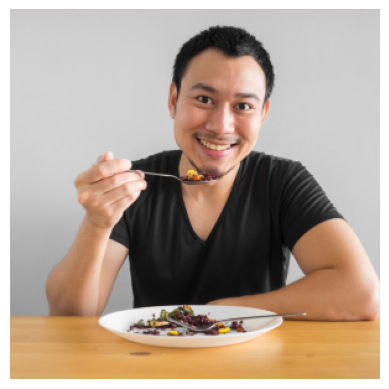

In [ ]:
img = obtain_image(url="https://thecenterformindfuleating.org/resources/Pictures/asian%20man%20eating.jpg")
show_img(img)

a man in a white shirt and a white shirt and tie
a man is holding a plate of food and a fork .
a man is holding a plate of food and a cup of wine .
a man holding a plate of food with a fork .
a man is holding a plate of food and a cup of wine .
a man is holding a plate of food and a bowl of wine .
a man holding a plate of food and a glass of wine .
a man is holding a piece of pizza in his hand .
a man is holding a plate of food and a fork .
a man in a white shirt and a tie


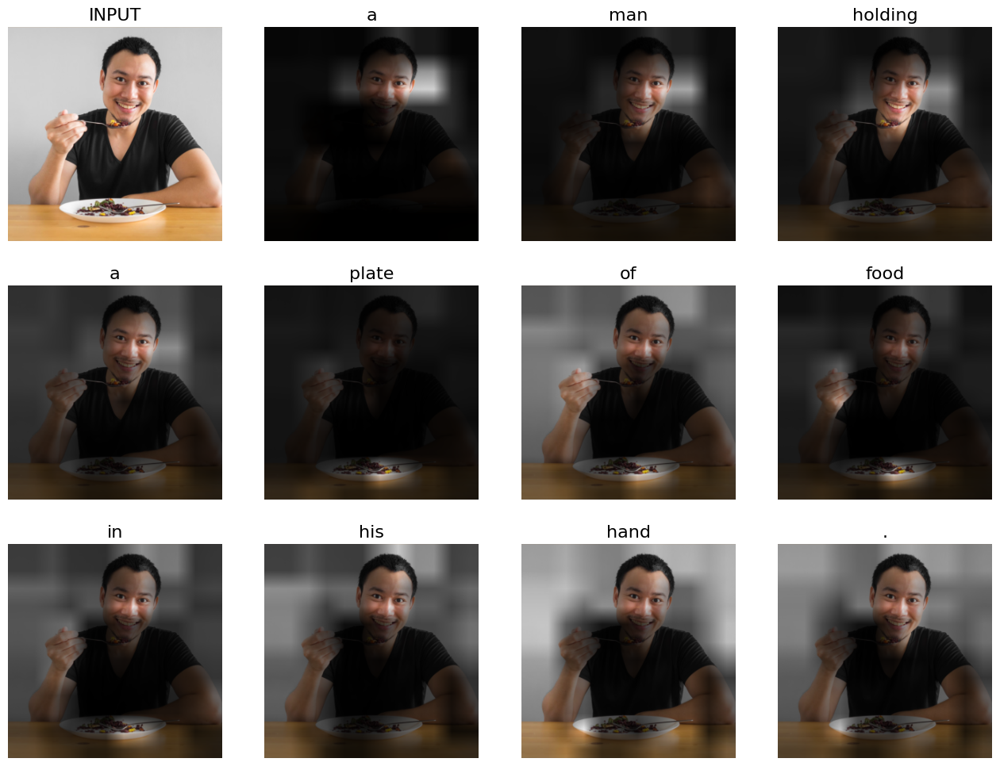

In [ ]:
process_image(img)

In [ ]:
process_image(obtain_image(url="https://www.dimensioneattiva.it/wp-content/uploads/2016/10/Bike5.jpg"))

UnidentifiedImageError: ignored

a cat sitting on top of a black and white cat .
a cat is laying on a black and white cat .
a cat is laying down on a couch .
a cat is laying down on a black and white cat .
a cat is laying down on a couch .
a cat that is laying down on a couch .
a cat is laying down on a black and white cat .
a cat is laying down on a black and white cat .
a cat that is laying down on a couch .
a cat is laying down on a couch .


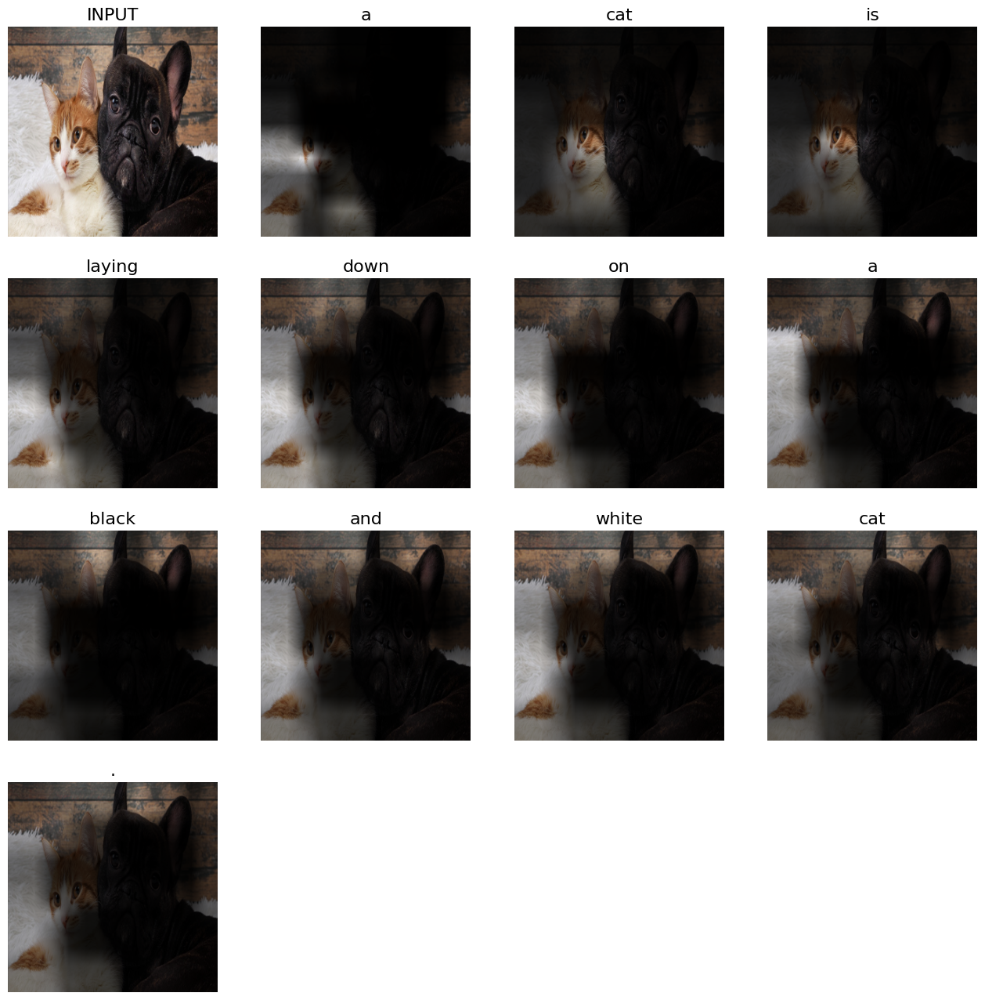

In [ ]:
process_image(obtain_image(url="http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg"))

a man riding a skateboard down a ramp .
a man riding a skateboard down a ramp .
a man riding a skateboard down a ramp .
a man doing a trick on a skateboard .
a man riding a skateboard on top of a ramp .
a man riding a skateboard on top of a ramp .
a man riding a skateboard down a ramp .
a man riding a skateboard on top of a ramp .
a man is riding a skateboard in a skate park .
a man riding a skateboard on top of a ramp .


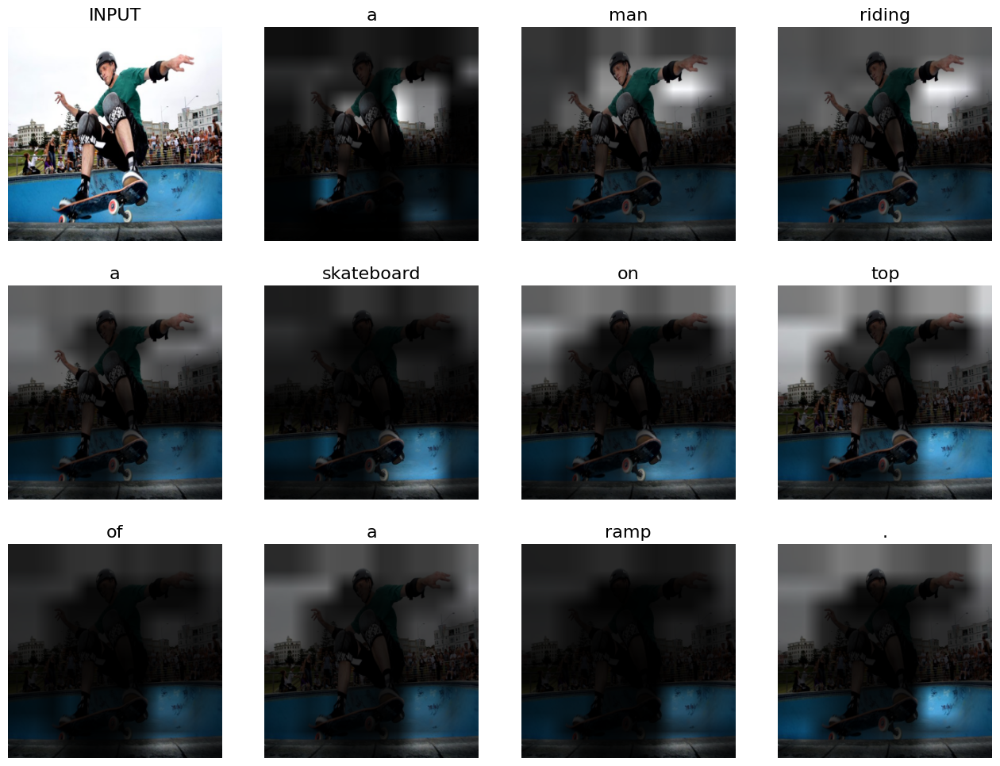

In [ ]:
process_image(obtain_image(url="https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg"))

# Demo
### Find at least 10 images to test it on.
* Seriously, that's part of an assignment. Go get at least 10 pictures to get captioned
* Make sure it works okay on __simple__ images before going to something more comples
* Photos, not animation/3d/drawings, unless you want to train CNN network on anime
* Mind the aspect ratio

a small dog is standing in the grass .
a small dog is standing in the grass .
a small dog is standing in the grass .
a small dog is standing in the grass .
a small dog is standing in the grass .
a small dog is standing in a field
a small dog is standing in a grassy field .
a small dog is standing in the grass .
a small dog is standing in a grassy field .
a small dog is playing with a frisbee .


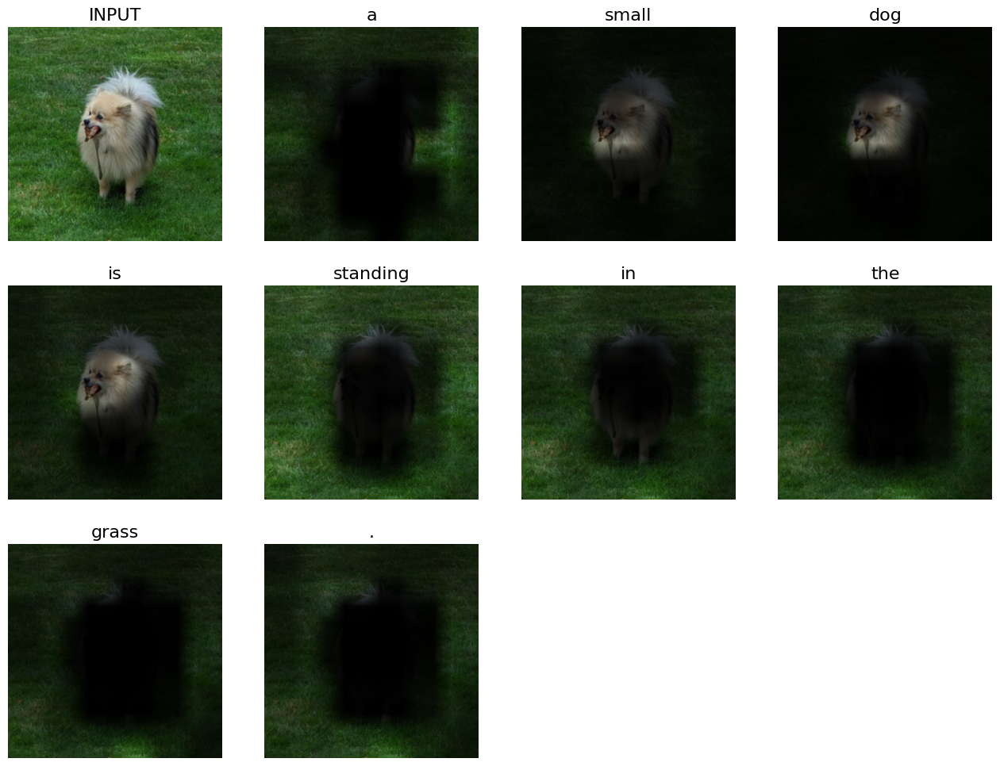

In [ ]:
process_image(obtain_image(filename="dog.jpg"))

a black and white cat laying on a bed .
a cat is laying on a black and white cat .
a cat is laying on a blanket on a couch .
a cat is laying on a black and white cat .
a black and white cat laying on a black and white cat .
a black and white cat laying on a black and white cat .
a black and white cat is laying on a black and white cloth .
a cat is laying on a bed with a black cat .
a black and white cat laying on a black and white cloth .
a black and white cat laying on a black and white cat .


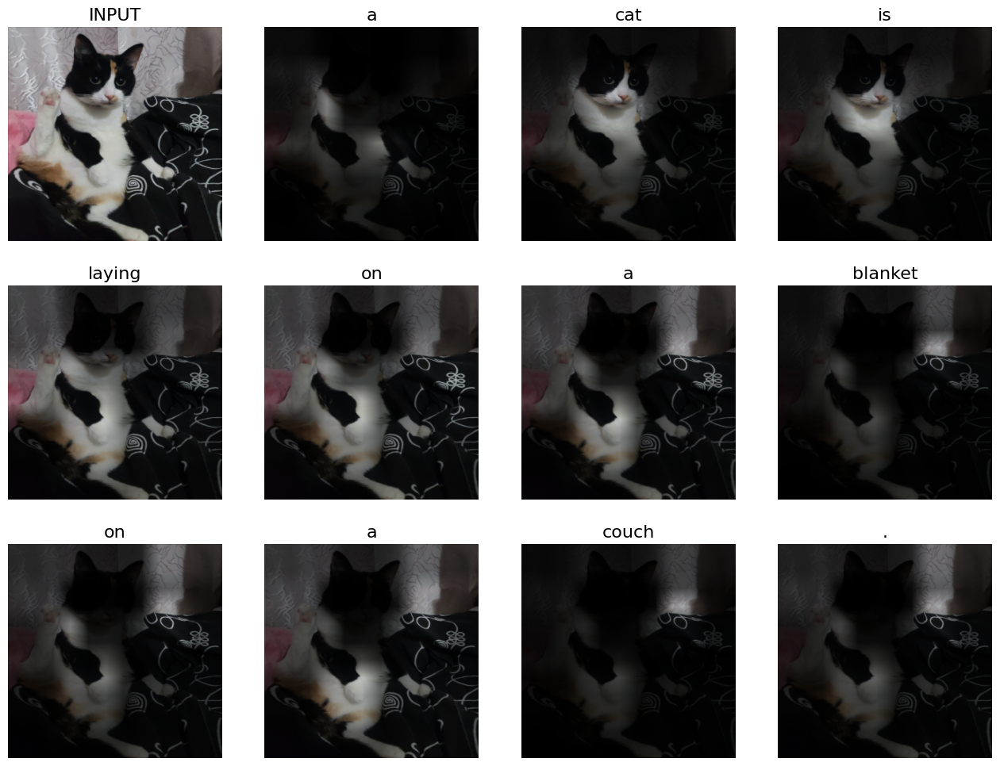

In [ ]:
process_image(obtain_image(filename="cat.jpg"))

a bridge with a clock on the front of it .
a large building with a clock tower and a clock tower .
a large building with a clock tower and a clock tower .
a large building with a clock tower and a clock tower .
a large building with a clock tower and a clock tower .
a large building with a clock tower and a clock tower .
a large building with a clock on the front of it .
a large building with a clock tower and a clock tower .
a large building with a clock tower and a clock tower .
a large building with a clock tower and a clock tower .


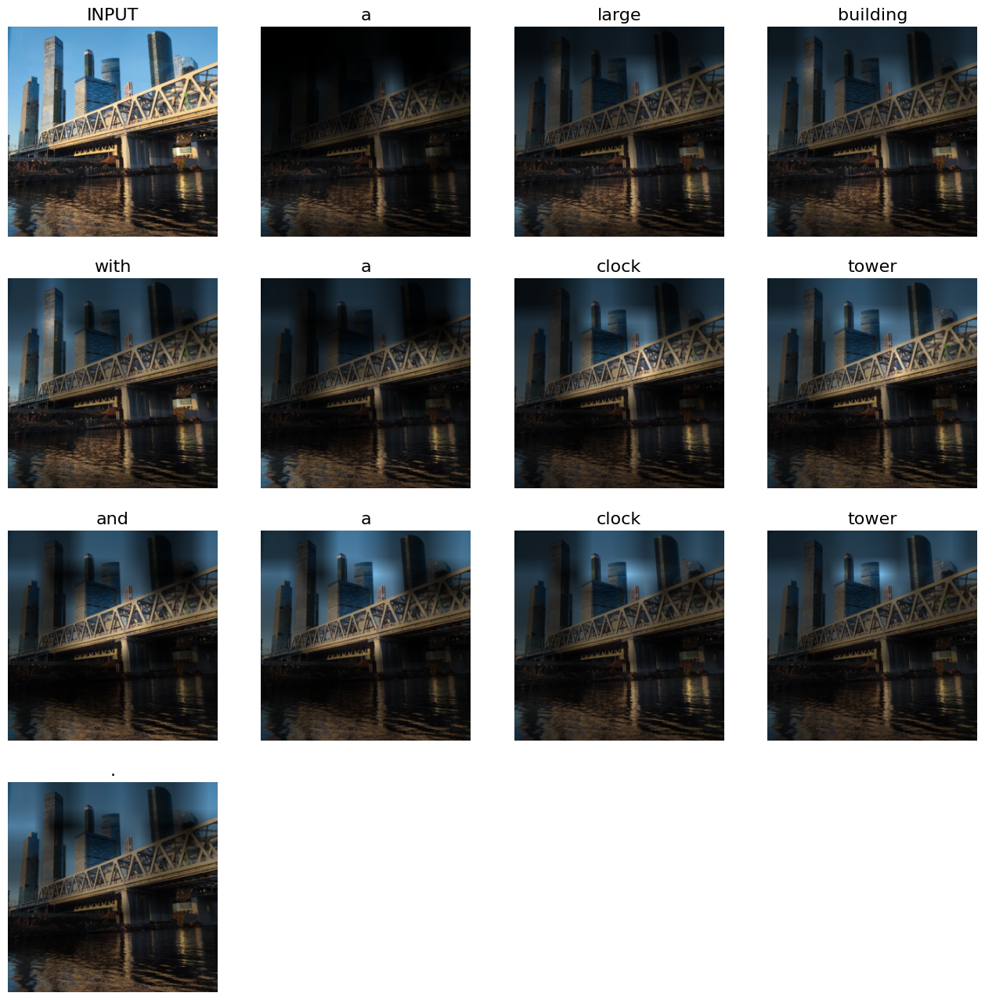

In [ ]:
process_image(obtain_image(filename="city.jpg"))

a cup of coffee and a cup of coffee on a table .
a cup of coffee and a cup of coffee .
a cup of coffee and a cup of coffee .
a cup of coffee and a cup of coffee .
a cup of coffee and a cup of coffee .
a cup of coffee and a cup of coffee .
a cup of coffee and a cup of coffee .
a cup of coffee and a cup of coffee .
a cup of coffee and a cup of coffee .
a cup of coffee and a cup of coffee .


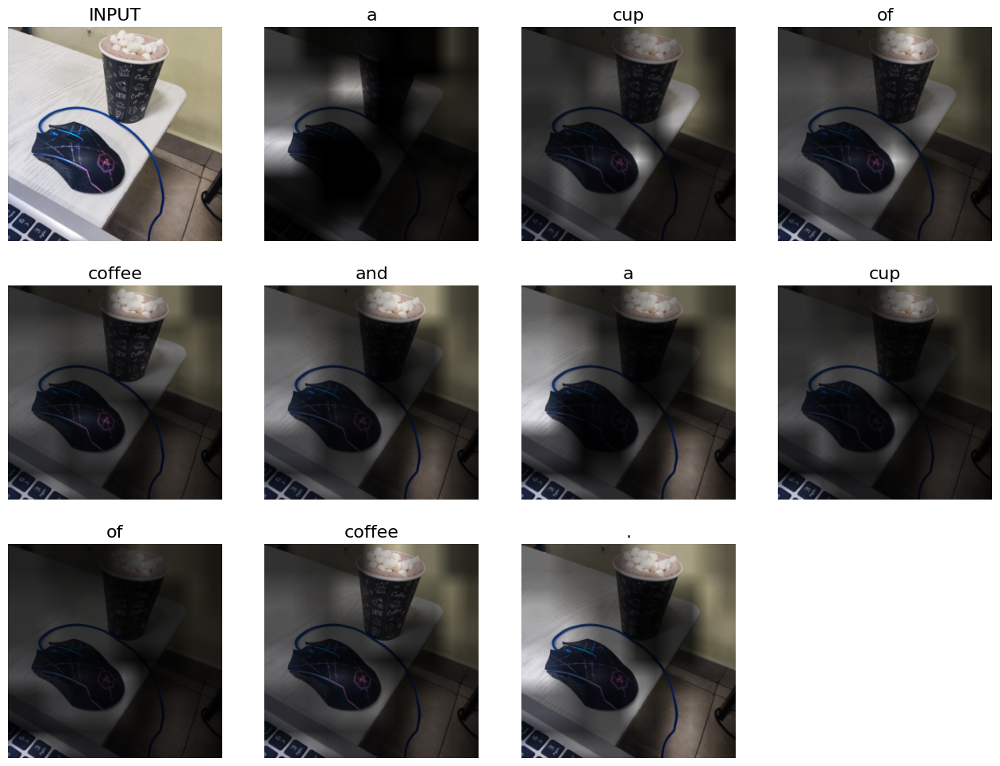

In [ ]:
process_image(obtain_image(filename="cocoa.jpg"))

In [ ]:
process_image(obtain_image(filename="coffee.jpg"))

Output hidden; open in https://colab.research.google.com to view.

a table with a bunch of different types of food on it
a table with a table and a table with a vase of flowers .
a table with a vase filled with flowers and a glass of wine .
a table with a vase filled with flowers and a glass of wine .
a table with a vase filled with flowers and a glass of wine .
a table with a vase filled with flowers and a glass of wine .
a table with a table and a vase filled with flowers .
a table with a vase and a vase of flowers on it .
a table with a vase and a vase with a flower .
a table with a table and a table with a vase and a vase of flowers .


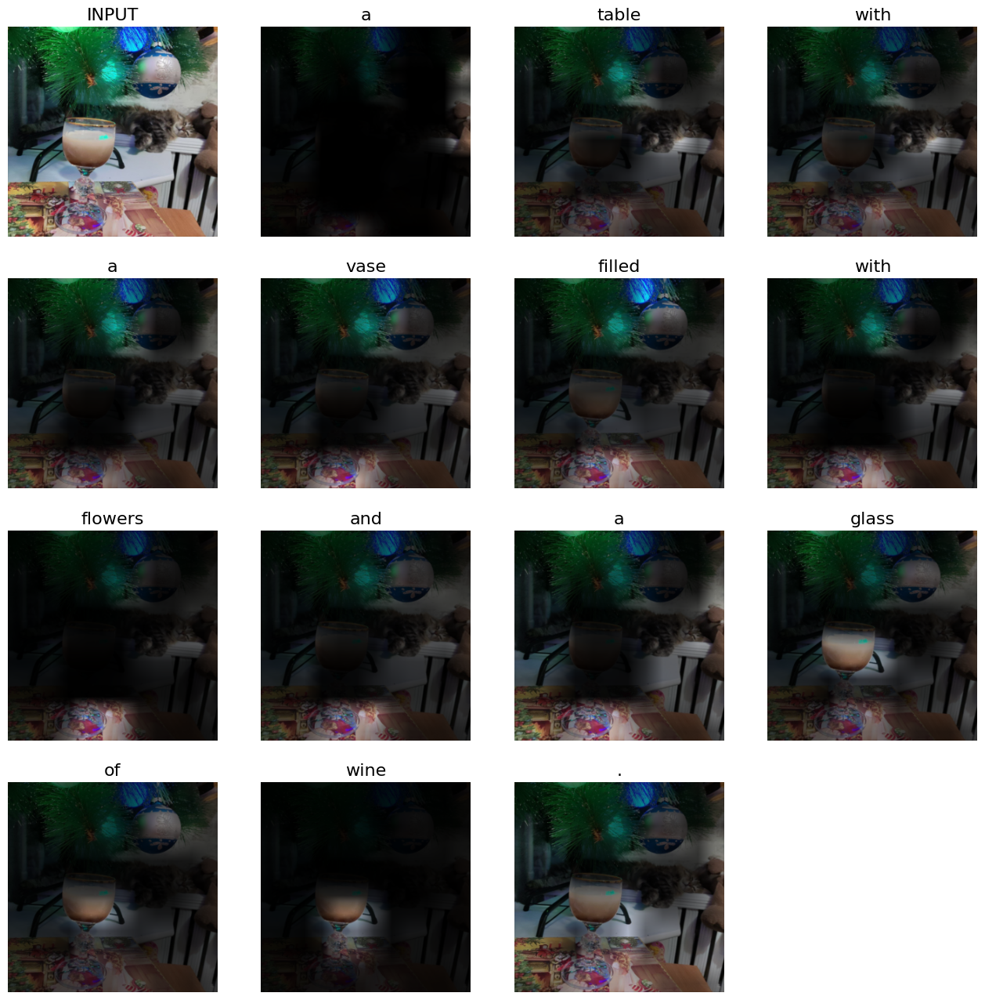

In [ ]:
process_image(obtain_image(filename="ny.jpg"))

a large bird sitting on top of a rock .
a white bird sitting on top of a rock .
a large white bird sitting on top of a rock .
a large bird sitting on top of a stone slab .
a large bird sitting on top of a stone slab .
a small bird sitting on a rock with a large bird .
a bird sitting on a rock in a pond .
a white bird sitting on top of a stone slab .
a large bird sitting on a rock in a lake .
a bird is sitting on a rock in the water .


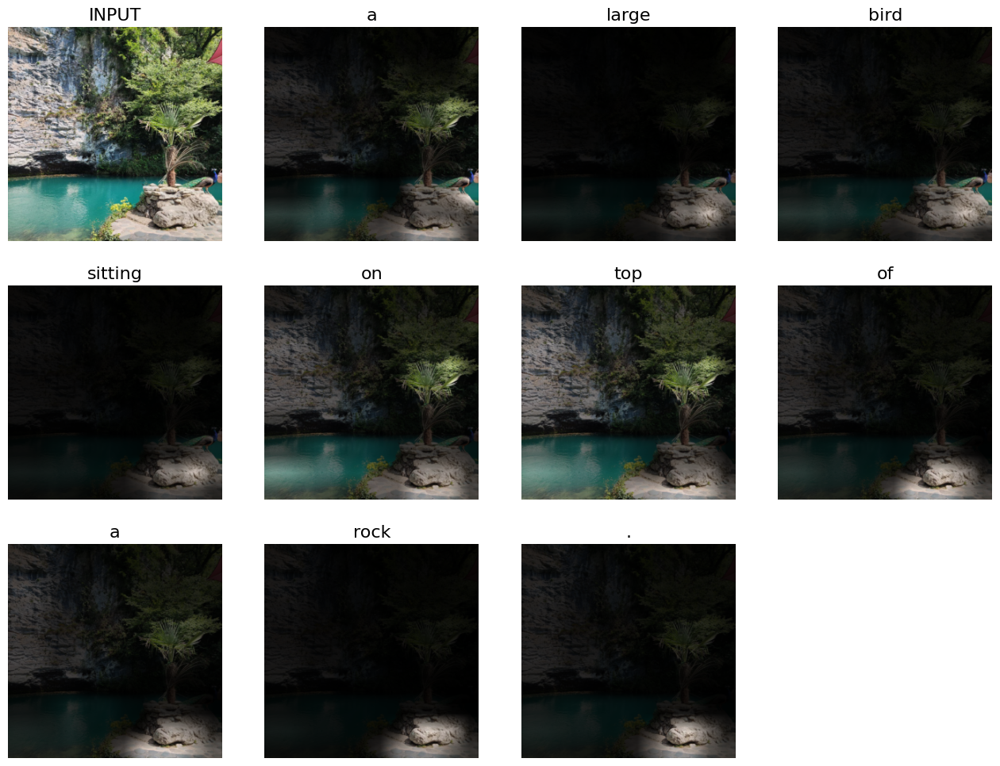

In [ ]:
process_image(obtain_image(filename="lake.jpg"))

a cat laying on top of a bed with a blanket .
a cat laying on a bed with a cat .
a cat laying on a bed with a pillow .
a cat laying on a bed with a blanket .
a cat laying on a bed with a cat on its back .
a cat laying on a bed with a cat .
a cat laying on a bed with a cat .
a cat laying on a bed with a pillow .
a cat laying on a bed with a cat .
a cat laying on a bed next to a cat .


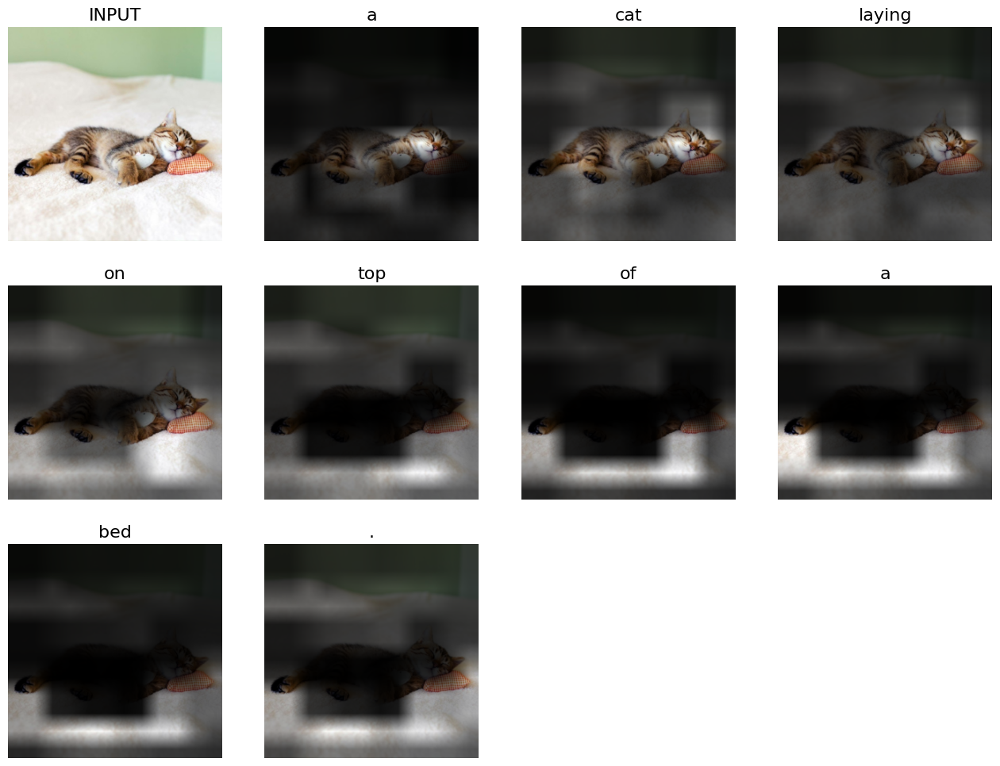

In [ ]:
process_image(obtain_image(url="https://koshkinhvost.ru/wp-content/uploads/2023/11/1643905289_61-damion-club-p-kotik-spit-v-krovatke-zhivotnie-75.jpg"))

a man with a beard and a beard with a beard and a man in his mouth .
a man is brushing his teeth while looking at the camera .
a man is brushing his teeth in a mirror .
a man with a beard and a beard with a beard and a beard .
a man is brushing his teeth in a mirror .
a man brushing his teeth in a mirror .
a man is holding a toothbrush in his mouth .
a man is brushing his teeth while looking at the camera .
a man is brushing his teeth in a mirror .
a man is brushing his teeth while looking at a cell phone .


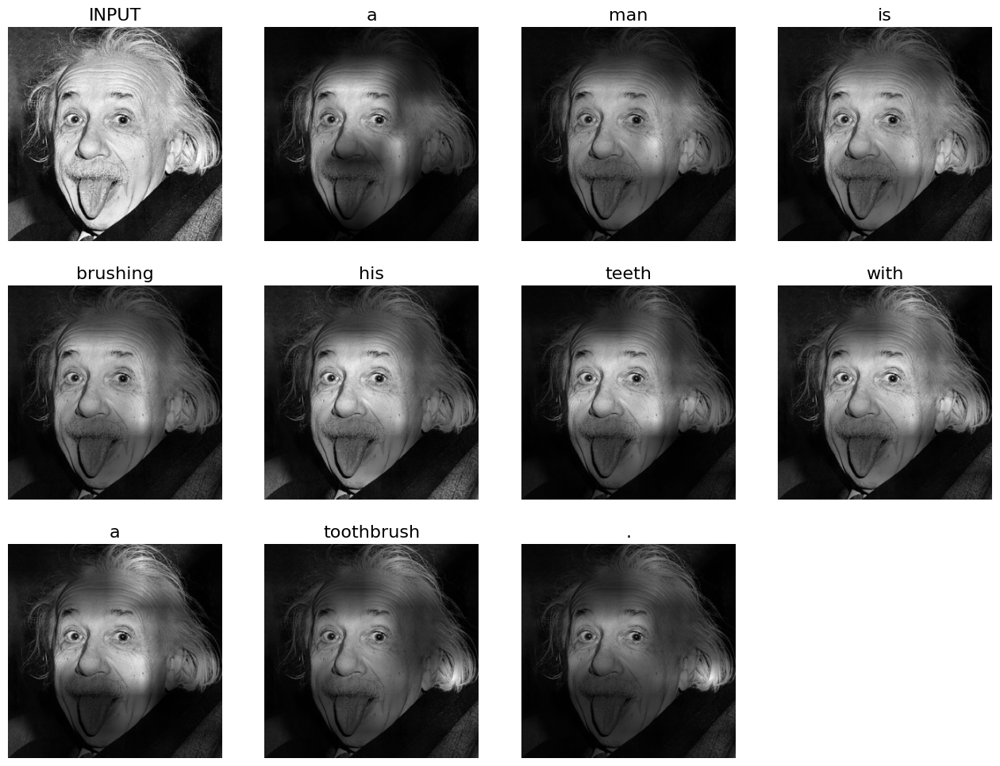

In [ ]:
process_image(obtain_image(url="https://i.pinimg.com/736x/ce/48/85/ce488538f24f5085f676c2ee0eabc4a5--the-tongue-popular-culture.jpg"))

a black and white picture of a black and white picture of a man .
a black and white picture of a black and white cow .
a large black and white bird flying in the sky .
a black and white picture of a black and white picture of a person .
a black and white picture of a black and white photo of a man and a black and white photo .
a black and white picture of a black and white picture of a person .
a black and white photo of a black and white cow .
a black and white photo of a black and white bird .
a black and white picture of a white cow .
a black and white picture of a black and white picture of a man .


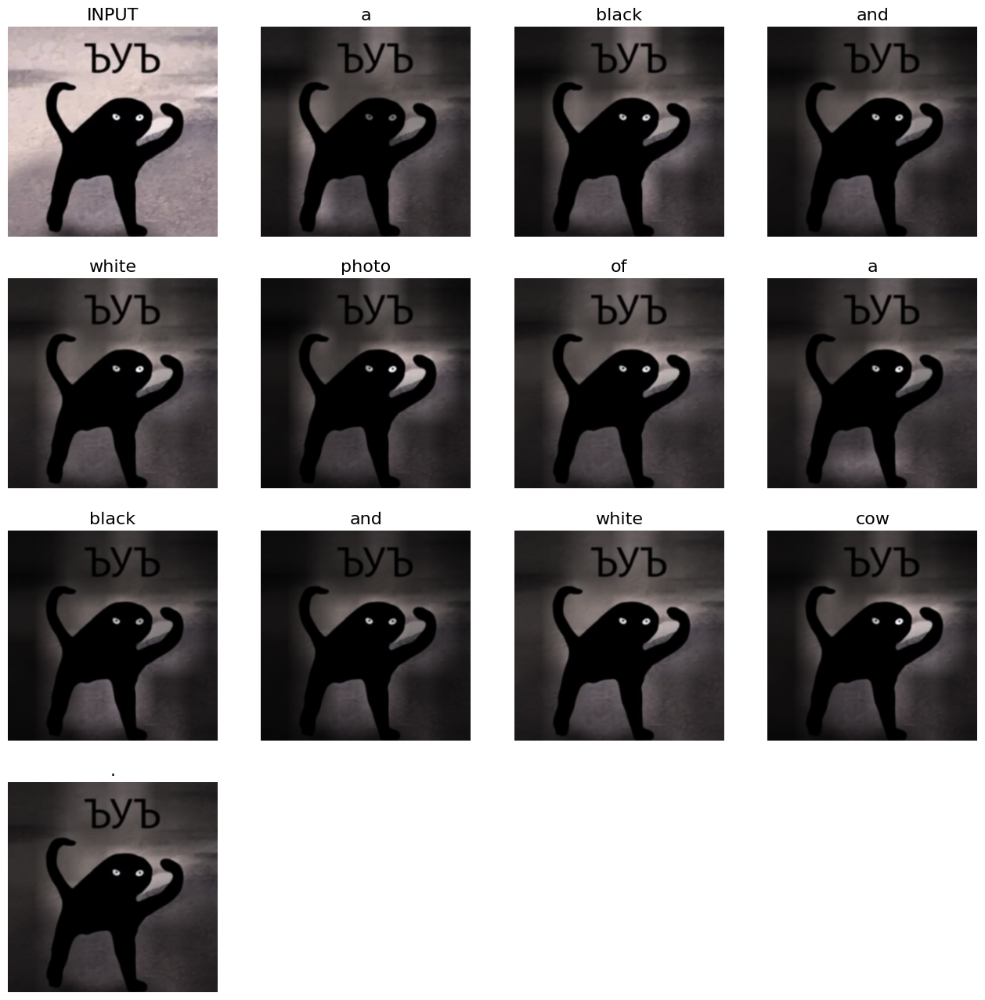

In [ ]:
process_image(obtain_image(filename="cat_.jpg"))

### Conclusion

Модель неплохо угадывает тематику картинки, но не всегда распознаёт тёмные объекты, наличие второго предмета, текста.

### Now what?

Your model produces some captions but you still strive to improve it? You're damn right to do so. Here are some ideas that go beyond simply "stacking more layers". The options are listed easiest to hardest.

##### Attention
You can build better and more interpretable captioning model with attention over the generated part of the sentense.

##### Subword level captioning
In the base version, we replace all rare words with UNKs which throws away a lot of information and reduces quality. A better way to deal with vocabulary size problem would be to use Byte-Pair Encoding

* BPE implementation you can use: [github_repo](https://github.com/rsennrich/subword-nmt).
* Theory: https://arxiv.org/abs/1508.07909
* It was originally built for machine translation, but it should work with captioning just as well.

#### Reinforcement learning
* After your model has been pre-trained in a teacher forced way, you can tune for captioning-speific models like CIDEr.
* Tutorial on RL for sequence models: [practical_rl week8](https://github.com/yandexdataschool/Practical_RL/tree/master/week8_scst)
* Theory: https://arxiv.org/abs/1612.00563